In [1]:
# merge two recordings (BL and stimulation) from the same population
# load both datasets, pre-process separately, detect spikes, 
# cluster separately, cluster average spike from BL with average spike from stim

In [2]:
from NewLibraryENG import *

In [3]:
name_data_BL = '2019-01-23T11-19-05PoP1 healthy cortical .h5'
name_data_st = '2019-01-23T16-06-32Pop1 healthy cortical .h5'
name_data_24 = '2019-01-24T16-00-33Pop1 24hour after.h5'

complete_string_BL='/Users/Gaia_1/Desktop/allh5files/healthy/healthy_baseline/'+name_data_BL
complete_string_st='/Users/Gaia_1/Desktop/allh5files/healthy/healthy_stimulation/'+name_data_st
complete_string_24='/Users/Gaia_1/Desktop/allh5files/healthy/healthy 24hrs later/'+name_data_24

In [4]:
#Baseline
data = h5py.File(complete_string_BL,'r')

data_readings = data['Data']['Recording_0']['AnalogStream']['Stream_0']['ChannelData'][()]
info = data['Data']['Recording_0']['AnalogStream']['Stream_0']['InfoChannel'][()]
info_table = pd.DataFrame(info, columns = list(info.dtype.fields.keys()))
labels = info_table['Label']
readings_BL = pd.DataFrame(data = data_readings.transpose(), columns = labels)
fs = 10000 #Sampling Frequency
print(readings_BL.shape)

(4222000, 60)


In [5]:
# Stimulation
data = h5py.File(complete_string_st,'r')

data_readings = data['Data']['Recording_0']['AnalogStream']['Stream_0']['ChannelData'][()]
info = data['Data']['Recording_0']['AnalogStream']['Stream_0']['InfoChannel'][()]
info_table = pd.DataFrame(info, columns = list(info.dtype.fields.keys()))
labels = info_table['Label']
readings_st = pd.DataFrame(data = data_readings.transpose(), columns = labels)
fs = 10000 #Sampling Frequency
print(readings_st.shape)

(4260000, 60)


In [6]:
#24hrs
data = h5py.File(complete_string_24,'r')

data_readings = data['Data']['Recording_0']['AnalogStream']['Stream_0']['ChannelData'][()]
info = data['Data']['Recording_0']['AnalogStream']['Stream_0']['InfoChannel'][()]
info_table = pd.DataFrame(info, columns = list(info.dtype.fields.keys()))
labels = info_table['Label']
readings_24 = pd.DataFrame(data = data_readings.transpose(), columns = labels)
fs = 10000 #Sampling Frequency
print(readings_24.shape)

(4228000, 60)


In [7]:
readings_BL.columns

Index([ b'47',  b'48',  b'46',  b'45',  b'38',  b'37',  b'28',  b'36',  b'27',
        b'17',  b'26',  b'16',  b'35',  b'25', b'Ref',  b'14',  b'24',  b'34',
        b'13',  b'23',  b'12',  b'22',  b'33',  b'21',  b'32',  b'31',  b'44',
        b'43',  b'41',  b'42',  b'52',  b'51',  b'53',  b'54',  b'61',  b'62',
        b'71',  b'63',  b'72',  b'82',  b'73',  b'83',  b'64',  b'74',  b'84',
        b'85',  b'75',  b'65',  b'86',  b'76',  b'87',  b'77',  b'66',  b'78',
        b'67',  b'68',  b'55',  b'56',  b'58',  b'57'],
      dtype='object', name='Label')

In [8]:
inizio=500000
len_data=4220000 #192 secondi
#len_data=len(readings)
ref_BL=readings_BL[b'Ref']
ref_st=readings_st[b'Ref']
ref_24=readings_24[b'Ref']
prova_BL=readings_BL.drop([b'Ref'],axis=1)
prova_st=readings_st.drop([b'Ref'],axis=1)
prova_24=readings_24.drop([b'Ref'],axis=1)
prova_BL=prova_BL.iloc[inizio:len_data, 10:]
prova_BL=prova_BL[b'53']
prova_st=prova_st.iloc[inizio:len_data, 10:]
prova_st=prova_st[b'53']
prova_24=prova_24.iloc[inizio:len_data, 10:]
prova_24=prova_24[b'53']
ref_BL=ref_BL[inizio:len_data]
ref_st=ref_st[inizio:len_data]
ref_24=ref_24[inizio:len_data]

print(prova_BL.shape,ref_BL.shape,prova_st.shape,ref_st.shape,prova_24.shape,ref_24.shape)

(3720000,) (3720000,) (3720000,) (3720000,) (3720000,) (3720000,)


In [9]:
lowcut = 300
highcut = 3000
fs=10000
order=8
b,a=butter_bandpass(lowcut,highcut,fs,order=order)
filt_ref=filtfilt(b,a,ref_BL)
filt_prova=filtfilt(b,a,prova_BL)
f_prova = filt_prova - filt_ref
prova_BL=f_prova

filt_ref=filtfilt(b,a,ref_st)
filt_prova=filtfilt(b,a,prova_st)
f_prova = filt_prova - filt_ref
prova_st=f_prova

filt_ref=filtfilt(b,a,ref_24)
filt_prova=filtfilt(b,a,prova_24)
f_prova = filt_prova - filt_ref
prova_24=f_prova

print(prova_BL.shape,prova_st.shape,prova_24.shape)

(3720000,) (3720000,) (3720000,)


#BL
prova=prova_BL

prova_rows = range(prova.shape[0])
filt_prova = pd.DataFrame(data = 0, columns=prova.columns, index=prova_rows, dtype = "float32")
lowcut = 300
highcut = 3000
fs=10000
order=8
b,a=butter_bandpass(lowcut,highcut,fs,order=order)
filt_ref=filtfilt(b,a,ref_BL)
#ref_df = pd.DataFrame({b'Ref': filt_ref})
for x in tqdm(range(prova.shape[1])):
    filt_prova.values[:,x] = scipy.signal.filtfilt(b, a, prova.values[:,x])
for electrode in prova.columns:
    filt_prova[electrode] = filt_prova[electrode] - filt_ref
#filt_prova = pd.concat([filt_prova, ref_df], axis=1)
prova_BL=filt_prova
prova_BL.shape

#stim
prova=prova_st

prova_rows = range(prova.shape[0])
filt_prova = pd.DataFrame(data = 0, columns=prova.columns, index=prova_rows, dtype = "float32")
lowcut = 300
highcut = 3000
fs=10000
order=8
b,a=butter_bandpass(lowcut,highcut,fs,order=order)
filt_ref=filtfilt(b,a,ref_st)
#ref_df = pd.DataFrame({b'Ref': filt_ref})
for x in tqdm(range(prova.shape[1])):
    filt_prova.values[:,x] = scipy.signal.filtfilt(b, a, prova.values[:,x])
for electrode in prova.columns:
    filt_prova[electrode] = filt_prova[electrode] - filt_ref
#filt_prova = pd.concat([filt_prova, ref_df], axis=1)
prova_st=filt_prova
prova_st.shape

prova_st.index+=1920000
prova_st.index

In [ ]:
mer=pd.concat([prova_BL,prova_st],axis=0)
mer

In [ ]:
mer.index

In [ ]:
switch_index=1920000

In [ ]:
merge=np.concatenate((prova_BL, prova_st), axis=0)
len(merge)

# detection

In [10]:
pos_BL, neg_BL=find_all_spikes(prova_BL)
pos_st, neg_st=find_all_spikes(prova_st)
pos_24, neg_24=find_all_spikes(prova_24)

  0%|          | 0/3710000 [00:00<?, ?it/s]

positive spikes 7103 negative spikes 21818 detected spikes: 28921 firing rate:  77.74462365591398


  0%|          | 0/3710000 [00:00<?, ?it/s]

positive spikes 6224 negative spikes 6436 detected spikes: 12660 firing rate:  34.03225806451613


  0%|          | 0/3710000 [00:00<?, ?it/s]

positive spikes 2707 negative spikes 38171 detected spikes: 40878 firing rate:  109.88709677419355


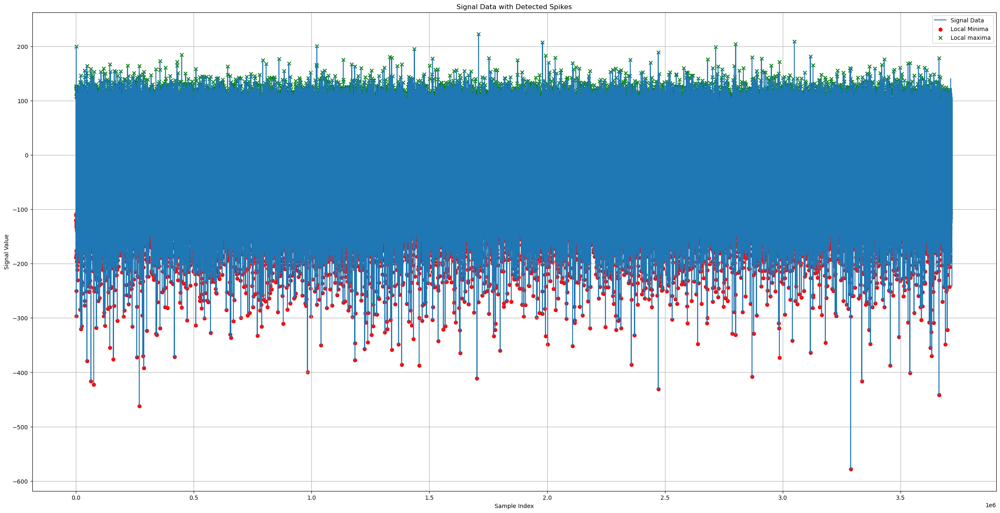

In [22]:
prova=prova_BL
maxima=pos_BL
minima=neg_BL

plt.figure(figsize=(30, 15))
plt.plot(prova, label='Signal Data')
plt.scatter(minima, [prova[i] for i in minima], c='red', marker='o', label='Local Minima')
plt.scatter(maxima, [prova[i] for i in maxima], c='green', marker='x', label='Local maxima')
plt.xlabel('Sample Index')
plt.ylabel('Signal Value')
plt.legend()
plt.grid(True)
plt.title('Signal Data with Detected Spikes')
#plt.axis([0,30000,-5,5])
#plt.savefig('spikes2.jpg')
plt.show()

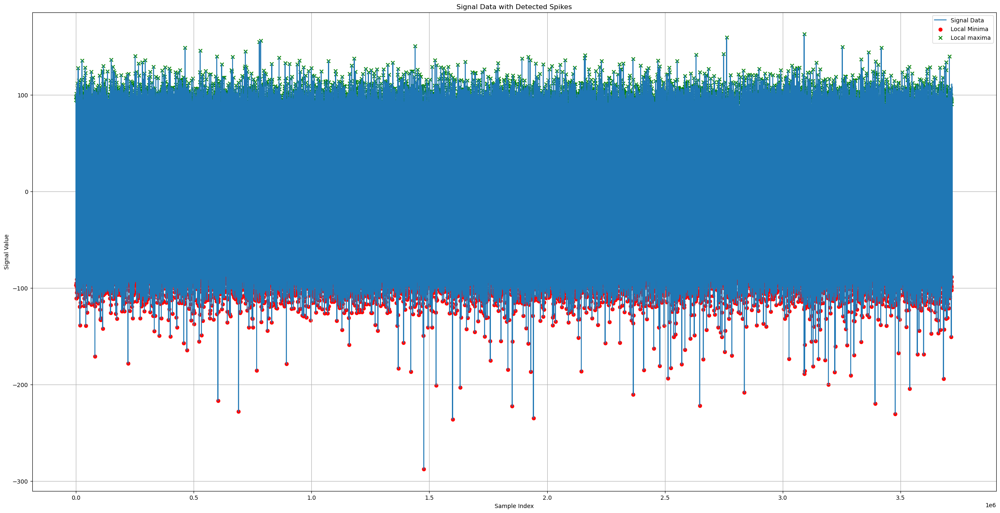

In [23]:
prova=prova_st
maxima=pos_st
minima=neg_st

plt.figure(figsize=(30, 15))
plt.plot(prova, label='Signal Data')
plt.scatter(minima, [prova[i] for i in minima], c='red', marker='o', label='Local Minima')
plt.scatter(maxima, [prova[i] for i in maxima], c='green', marker='x', label='Local maxima')
plt.xlabel('Sample Index')
plt.ylabel('Signal Value')
plt.legend()
plt.grid(True)
plt.title('Signal Data with Detected Spikes')
#plt.axis([0,30000,-5,5])
#plt.savefig('spikes2.jpg')
plt.show()

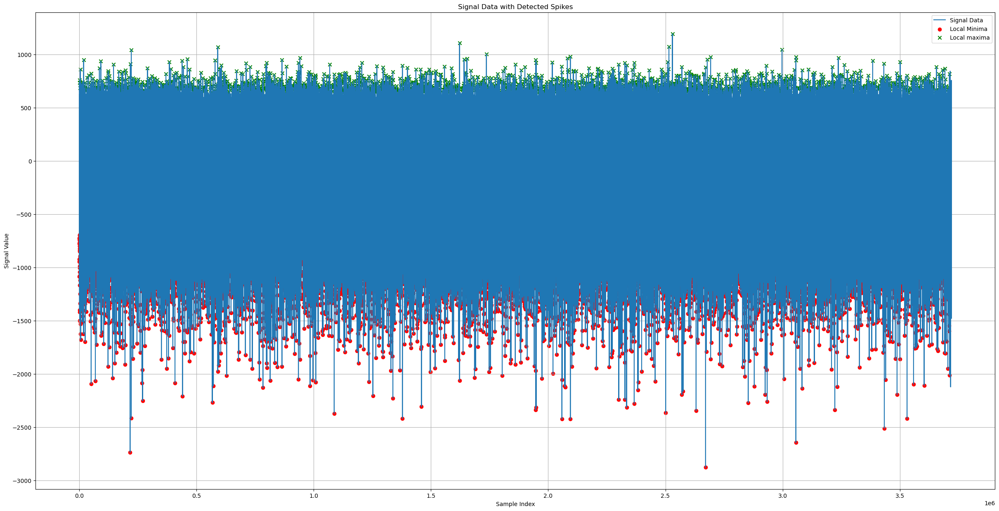

In [24]:
prova=prova_24
maxima=pos_24
minima=neg_24

plt.figure(figsize=(30, 15))
plt.plot(prova, label='Signal Data')
plt.scatter(minima, [prova[i] for i in minima], c='red', marker='o', label='Local Minima')
plt.scatter(maxima, [prova[i] for i in maxima], c='green', marker='x', label='Local maxima')
plt.xlabel('Sample Index')
plt.ylabel('Signal Value')
plt.legend()
plt.grid(True)
plt.title('Signal Data with Detected Spikes')
#plt.axis([0,30000,-5,5])
#plt.savefig('spikes2.jpg')
plt.show()

prova=prova_BL
pos_ind=[]
neg_ind=[]
for electrode in tqdm(prova.columns):
    channel=prova[electrode]
    pos, neg=find_all_spikes(channel)
    pos_ind_BL.append(pos)
    neg_ind_BL.append(neg)

prova=prova_st
pos_ind=[]
neg_ind=[]
for electrode in tqdm(prova.columns):
    channel=prova[electrode]
    pos, neg=find_all_spikes(channel)
    pos_ind_st.append(pos)
    neg_ind_st.append(neg)

In [11]:
pos_cut_BL,n_pos_BL, neg_cut_BL,n_neg_BL = cut(pos_BL,neg_BL,prova_BL)
pos_cut_st,n_pos_st, neg_cut_st,n_neg_st = cut(pos_st,neg_st,prova_st)
pos_cut_24,n_pos_24, neg_cut_24,n_neg_24 = cut(pos_24,neg_24,prova_24)

In [12]:
pos_cut_BL=mask_cuts(pos_cut_BL)
neg_cut_BL= mask_cuts(neg_cut_BL)

pos_cut_st=mask_cuts(pos_cut_st)
neg_cut_st= mask_cuts(neg_cut_st)

pos_cut_24=mask_cuts(pos_cut_24)
neg_cut_24= mask_cuts(neg_cut_24)

pos_cut=[]
neg_cut=[]
n_pos=[]
n_neg=[]

for i,electrode in enumerate(tqdm(prova.columns)):
    pos=pos_ind[i]
    neg=neg_ind[i]
    channel=prova[electrode]
    pos_cut1,n_pos1, neg_cut1,n_neg1 = cut(pos,neg,channel)
    pos_cut.append(pos_cut1)
    neg_cut.append(neg_cut1)
    n_pos.append(n_pos1)
    n_neg.append(n_neg1)
#savedp = copy.deepcopy(pos_cut)
#savedn = copy.deepcopy(neg_cut)

for i in (tqdm(range(len(pos_cut)))):
    pos_cut[i]=mask_cuts(pos_cut[i])
    neg_cut[i]= mask_cuts(neg_cut[i])

final_data_pos=[]
for channel in (tqdm(range(len(pos_cut)))):
    channel_clusters=clus(pos_cut[channel],'kmeans',n_pos[channel],prova.iloc[:,channel])
    final_data_pos.append(channel_clusters)

# clustering

Total spikes:  7103
For 2 clusters, the silhouette score is: 0.140
For 3 clusters, the silhouette score is: 0.160
For 4 clusters, the silhouette score is: 0.170
For 5 clusters, the silhouette score is: 0.185
For 6 clusters, the silhouette score is: 0.189
For 7 clusters, the silhouette score is: 0.190
For 8 clusters, the silhouette score is: 0.205
For 9 clusters, the silhouette score is: 0.200
For 10 clusters, the silhouette score is: 0.185


Best cluster in the range 2 to  10 :  8 , with a silhouette score of:  0.2054350235398916   


firing rate threshold:  -0.7190712980354808


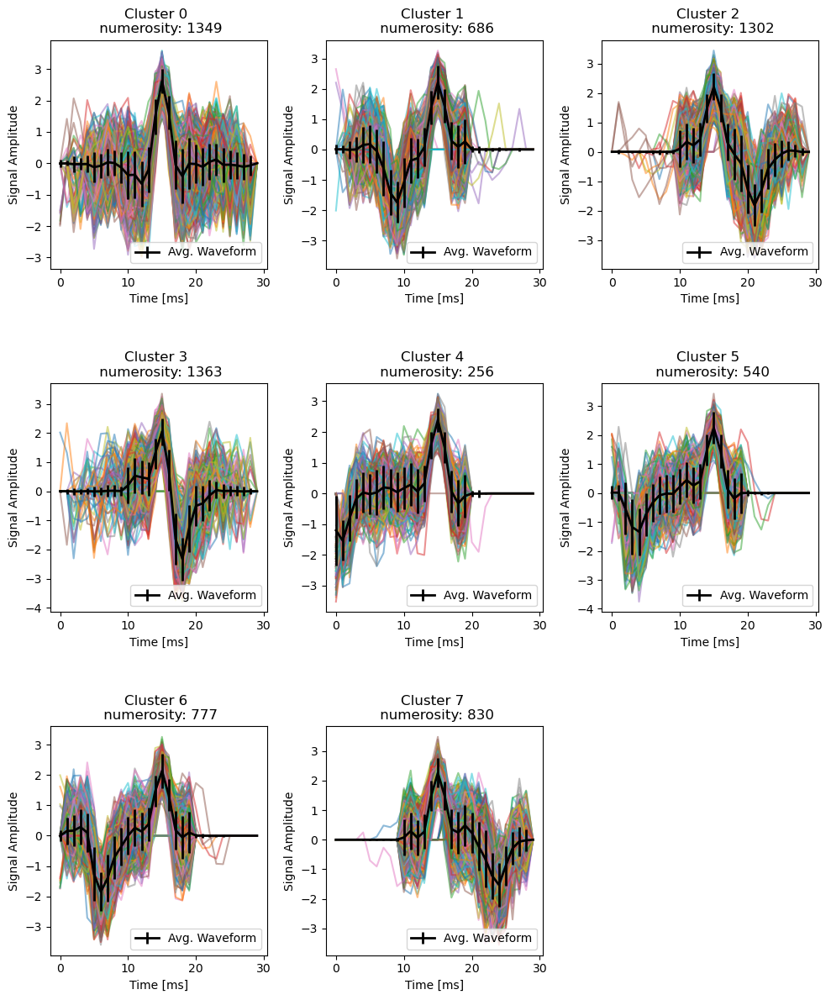

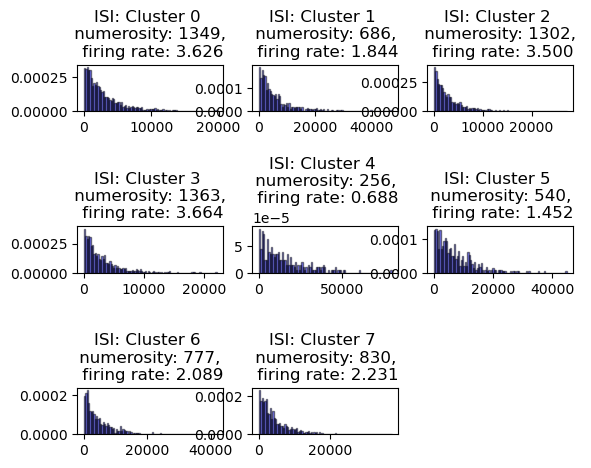

In [13]:
final_data_pos_BL= clus(pos_cut_BL,'kmeans',n_pos_BL,prova_BL)

Total spikes:  6224
For 2 clusters, the silhouette score is: 0.106
For 3 clusters, the silhouette score is: 0.120
For 4 clusters, the silhouette score is: 0.121
For 5 clusters, the silhouette score is: 0.134
For 6 clusters, the silhouette score is: 0.140
For 7 clusters, the silhouette score is: 0.136
For 8 clusters, the silhouette score is: 0.130
For 9 clusters, the silhouette score is: 0.131
For 10 clusters, the silhouette score is: 0.147


Best cluster in the range 2 to  10 :  10 , with a silhouette score of:  0.14718864172765844   


firing rate threshold:  0.05922261715638699


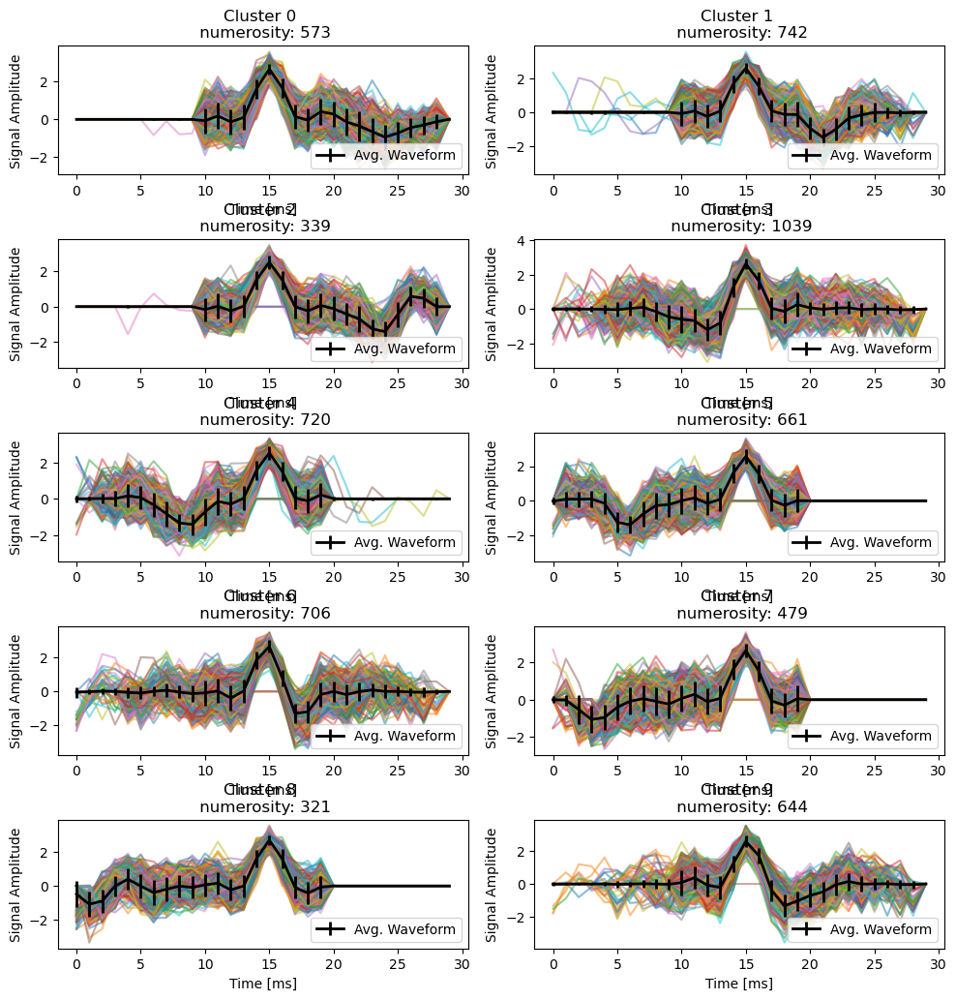

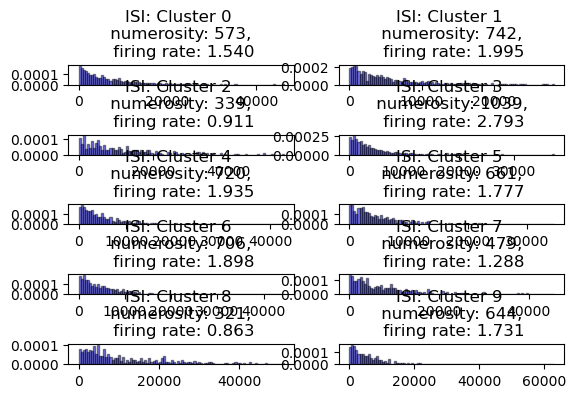

In [14]:
final_data_pos_st= clus(pos_cut_st,'kmeans',n_pos_st,prova_st)

Total spikes:  2707
For 2 clusters, the silhouette score is: 0.146
For 3 clusters, the silhouette score is: 0.178
For 4 clusters, the silhouette score is: 0.191
For 5 clusters, the silhouette score is: 0.214
For 6 clusters, the silhouette score is: 0.223
For 7 clusters, the silhouette score is: 0.209
For 8 clusters, the silhouette score is: 0.197
For 9 clusters, the silhouette score is: 0.212
For 10 clusters, the silhouette score is: 0.202


Best cluster in the range 2 to  10 :  6 , with a silhouette score of:  0.22275069760004962   


firing rate threshold:  0.07034919885241586


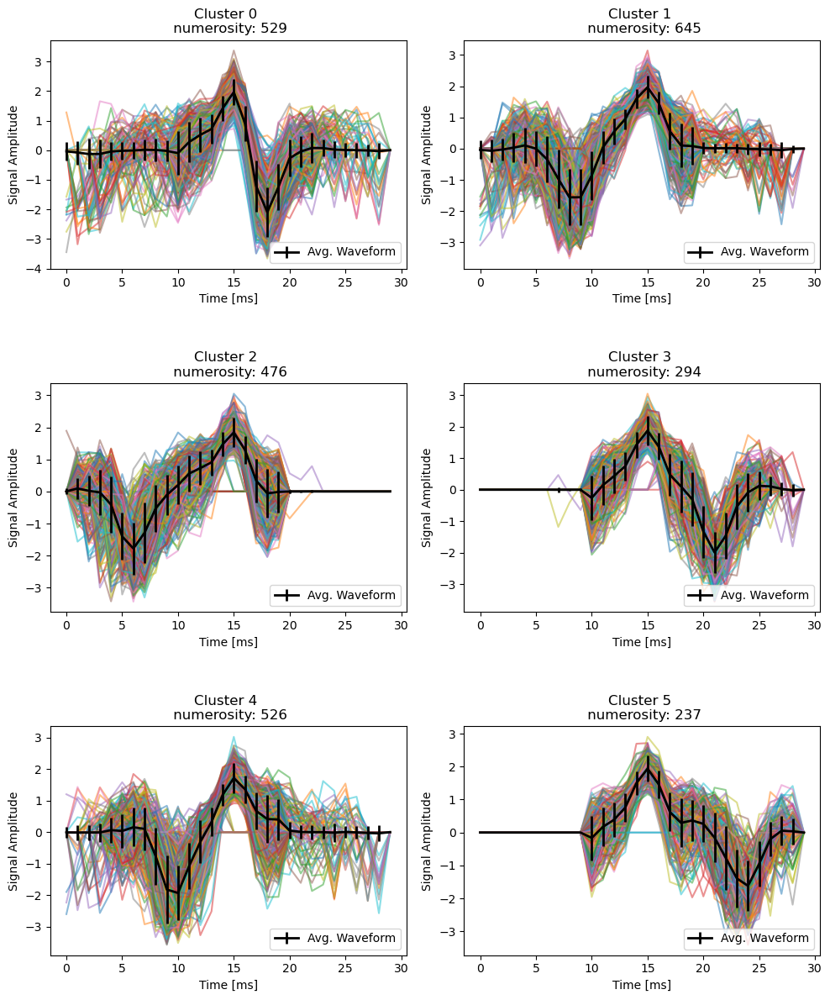

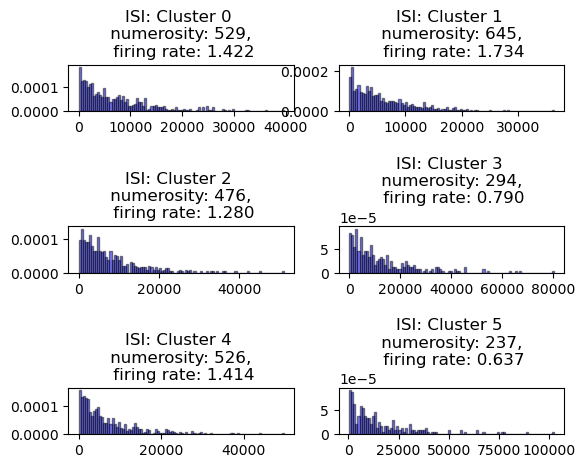

In [15]:
final_data_pos_24= clus(pos_cut_24,'kmeans',n_pos_24,prova_24)

Total spikes:  21817
For 2 clusters, the silhouette score is: 0.155
For 3 clusters, the silhouette score is: 0.145
For 4 clusters, the silhouette score is: 0.140
For 5 clusters, the silhouette score is: 0.139
For 6 clusters, the silhouette score is: 0.147
For 7 clusters, the silhouette score is: 0.129
For 8 clusters, the silhouette score is: 0.133
For 9 clusters, the silhouette score is: 0.136
For 10 clusters, the silhouette score is: 0.128


Best cluster in the range 2 to  10 :  2 , with a silhouette score of:  0.1546536703462877   


firing rate threshold:  -5.155913978494624


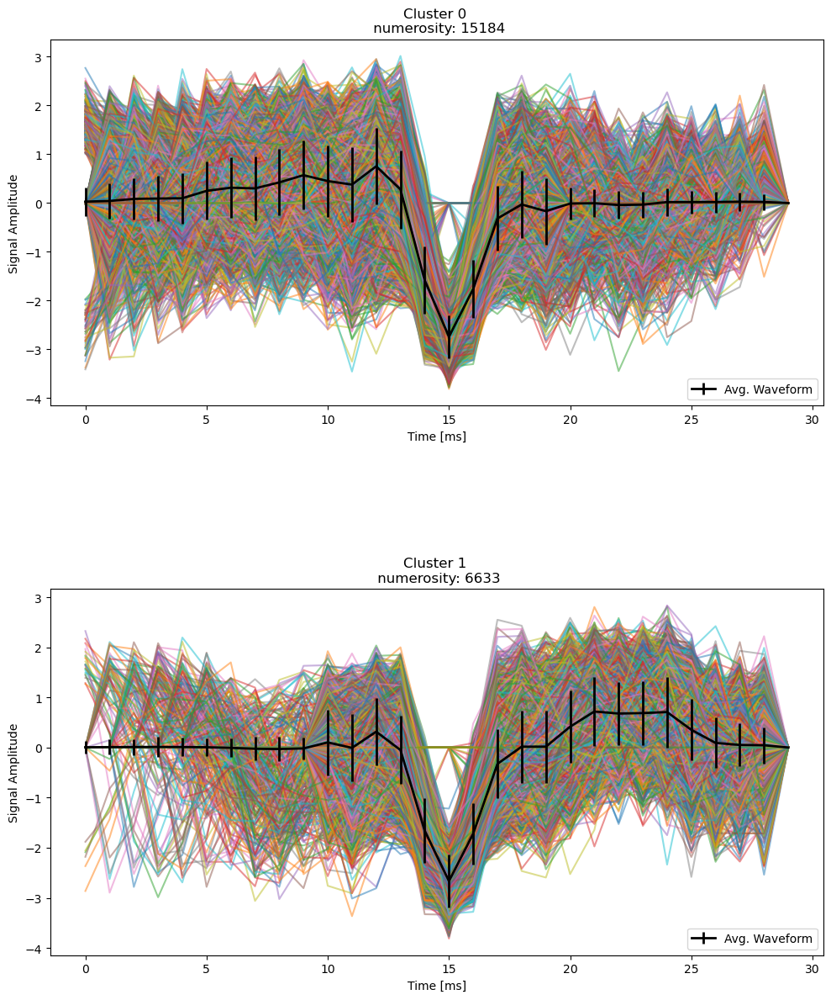

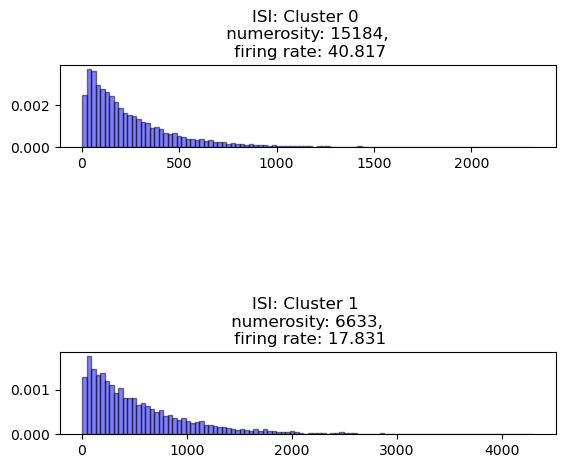

In [16]:
final_data_neg_BL= clus(neg_cut_BL,'kmeans',n_neg_BL,prova_BL)

Total spikes:  21817
For 2 clusters, the silhouette score is: 0.113
For 3 clusters, the silhouette score is: 0.099
For 4 clusters, the silhouette score is: 0.102
For 5 clusters, the silhouette score is: 0.091
For 6 clusters, the silhouette score is: 0.093
For 7 clusters, the silhouette score is: 0.083
For 8 clusters, the silhouette score is: 0.078
For 9 clusters, the silhouette score is: 0.077
For 10 clusters, the silhouette score is: 0.071


Best cluster in the range 2 to  10 :  2 , with a silhouette score of:  0.11282381357673715   


firing rate threshold:  20.74731182795699


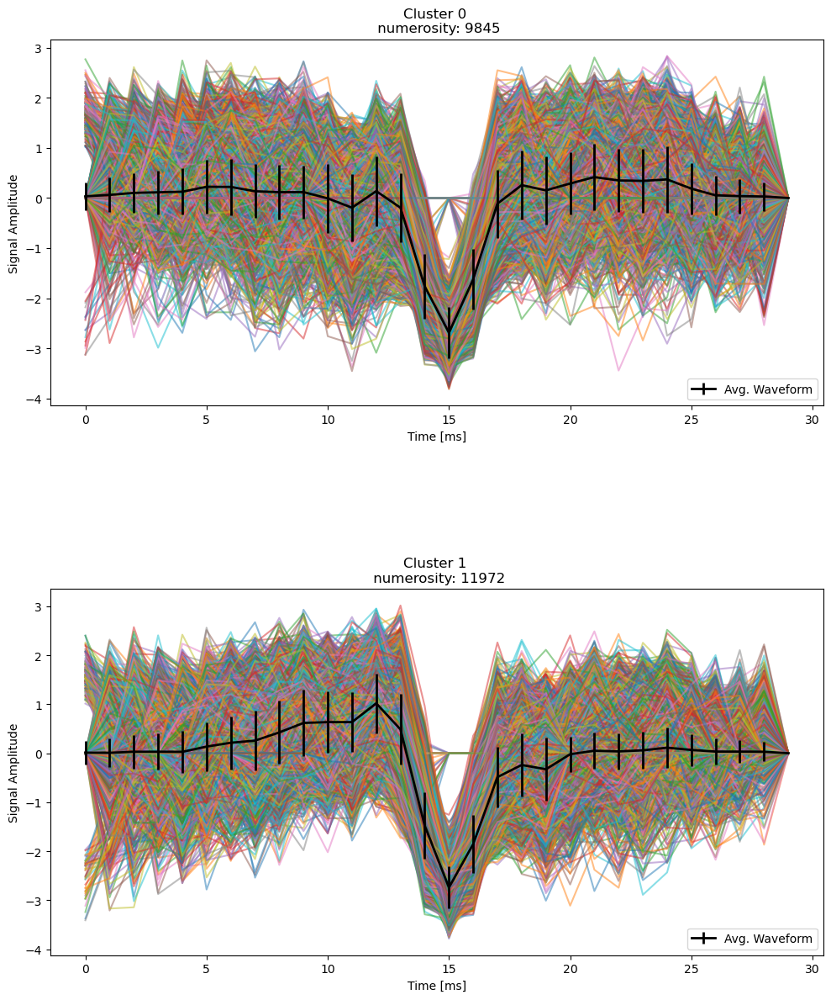

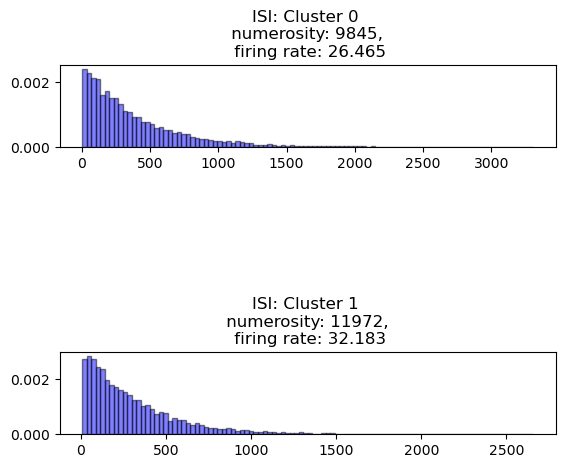

Total spikes:  9845


ValueError: Found array with dim 3. KMeans expected <= 2.

In [73]:
final_data_neg_BL= try_clus(neg_cut_BL,'kmeans',n_neg_BL,prova_BL)

Total spikes:  6436
For 2 clusters, the silhouette score is: 0.106
For 3 clusters, the silhouette score is: 0.120
For 4 clusters, the silhouette score is: 0.121
For 5 clusters, the silhouette score is: 0.130
For 6 clusters, the silhouette score is: 0.134
For 7 clusters, the silhouette score is: 0.134
For 8 clusters, the silhouette score is: 0.130
For 9 clusters, the silhouette score is: 0.127
For 10 clusters, the silhouette score is: 0.133


Best cluster in the range 2 to  10 :  7 , with a silhouette score of:  0.13417154733420059   


firing rate threshold:  -0.09772925414426936


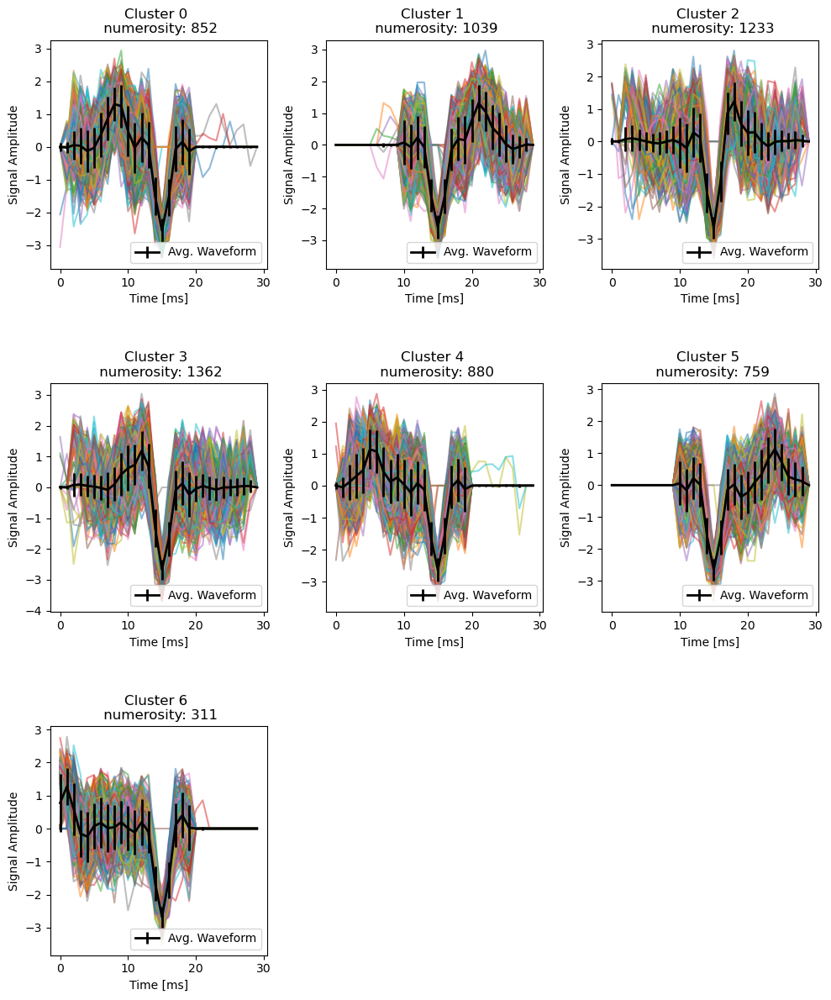

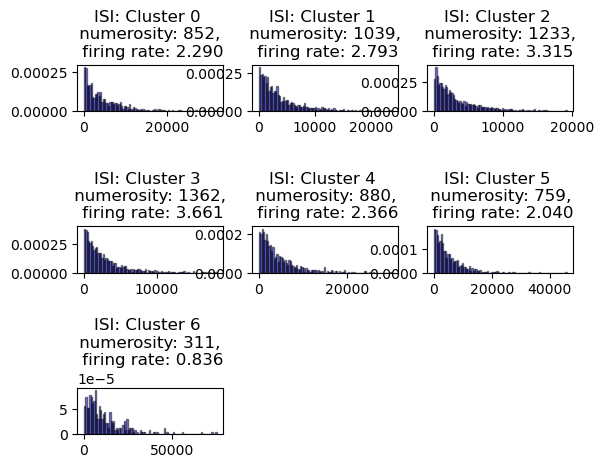

In [17]:
final_data_neg_st= clus(neg_cut_st,'kmeans',n_neg_st,prova_st)

Total spikes:  38171
For 2 clusters, the silhouette score is: 0.159
For 3 clusters, the silhouette score is: 0.166
For 4 clusters, the silhouette score is: 0.161
For 5 clusters, the silhouette score is: 0.156
For 6 clusters, the silhouette score is: 0.142
For 7 clusters, the silhouette score is: 0.157
For 8 clusters, the silhouette score is: 0.140
For 9 clusters, the silhouette score is: 0.144
For 10 clusters, the silhouette score is: 0.137


Best cluster in the range 2 to  10 :  3 , with a silhouette score of:  0.1659554949003672   


firing rate threshold:  9.382597045929746


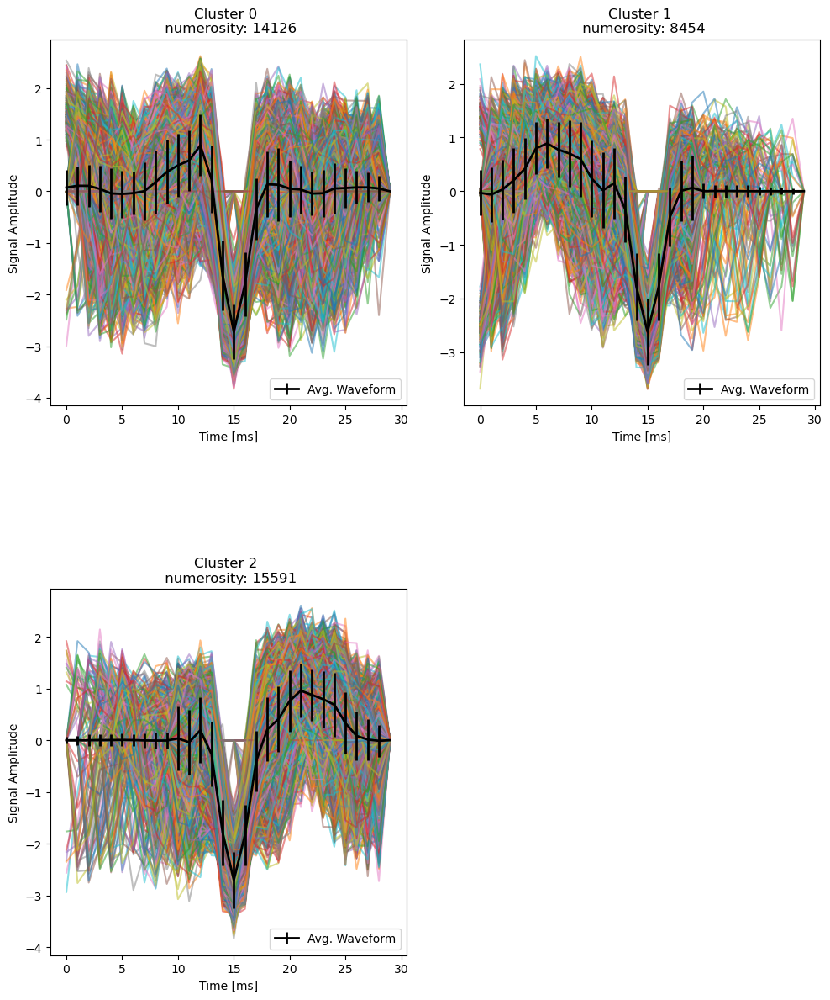

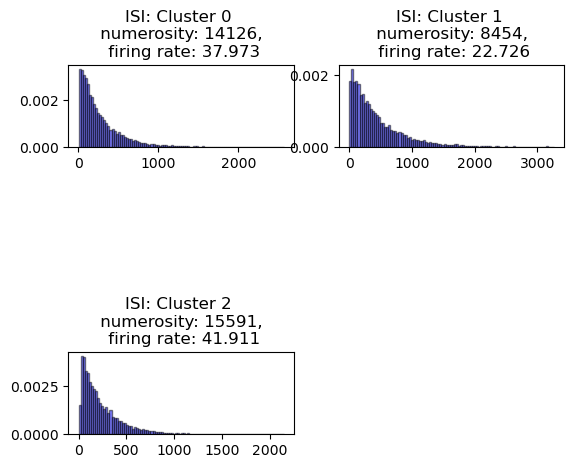

In [18]:
final_data_neg_24= clus(neg_cut_24,'kmeans',n_neg_24,prova_24)

In [33]:
#neg_cut_BL[final_data_neg_BL[0]]
neg_cut_BL.shape
print(len(final_data_neg_BL[0]),len(final_data_neg_BL[1]),len(final_data_neg_BL[0])+len(final_data_neg_BL[1]),neg_cut_BL.shape)

15184 6633 21817 (21817, 30)


In [34]:
final_data_neg_BL[1]

array([    838,    1472,    2446, ..., 3711445, 3713065, 3713069])

In [35]:
final_data_neg_BL[0]

array([    221,     360,     682, ..., 3712589, 3712683, 3713037])

In [36]:
n_neg_BL

[221,
 360,
 682,
 838,
 851,
 895,
 1188,
 1197,
 1284,
 1380,
 1422,
 1472,
 2332,
 2446,
 2529,
 2575,
 2605,
 2632,
 2776,
 2901,
 3194,
 3817,
 4090,
 4122,
 4241,
 4573,
 4594,
 4725,
 4944,
 5034,
 5058,
 5076,
 5354,
 5561,
 5673,
 5873,
 5899,
 5956,
 6011,
 6052,
 6107,
 6206,
 6494,
 6747,
 6885,
 7041,
 7149,
 7264,
 7359,
 7446,
 7949,
 8062,
 8188,
 8358,
 8381,
 8874,
 8897,
 9234,
 9252,
 9266,
 9549,
 9676,
 9923,
 10091,
 10429,
 10457,
 10482,
 10552,
 10705,
 10806,
 10979,
 11536,
 11569,
 11590,
 11727,
 11786,
 11876,
 11929,
 12134,
 12243,
 12702,
 12824,
 12888,
 13012,
 13659,
 13817,
 14160,
 14619,
 15164,
 15392,
 15498,
 15520,
 15633,
 15887,
 15909,
 16015,
 16075,
 16193,
 16346,
 16816,
 16835,
 16914,
 17105,
 17188,
 17240,
 17347,
 17487,
 17621,
 17927,
 18019,
 18207,
 18307,
 18615,
 18672,
 18698,
 18828,
 18835,
 18884,
 18955,
 19002,
 19253,
 19462,
 19561,
 19816,
 19967,
 20036,
 20251,
 20309,
 20598,
 20701,
 20754,
 20920,
 20944,
 2096

In [57]:
subgroup_indices = final_data_neg_BL[0]
indices_positions = [n_neg_BL.index(indices) for indices in subgroup_indices]
subgroup_spikes = [neg_cut_BL[pos] for pos in indices_positions]
subgroup_spikes

[array([ 0.        ,  0.        , -0.73765548, -0.15662331, -0.59204738,
        -0.16358978,  1.71003741,  2.20173746,  1.0970105 ,  0.76105688,
         0.7433833 ,  0.00830269, -0.00845268,  0.33666503, -1.0550211 ,
        -2.49065994, -1.44874781, -0.24020866, -1.13548999, -1.81451012,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ]),
 array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.56549766,  0.56225743,  1.1276404 ,  0.05015576, -2.39357527,
        -2.56834763, -0.19120302,  0.83350992,  0.02028637,  0.24556635,
         0.91332223, -0.03413629, -0.942026  , -0.48222273, -0.71264694,
        -1.68265605, -0.72123467,  1.39962312,  0.        ,  0.        ]),
 array([ 0.        ,  1.20804367,  0.65308415,  0.04644258,  0.12886845,
         0.20932894,  0.15018106,  0.3269566 , 

In [91]:
#def try_clus(cut,clustering,spike_list,data):
cut=neg_cut_BL
clustering='kmeans'
spike_list=n_neg_BL
data=prova_BL
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN, HDBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.metrics import silhouette_score
from scipy.stats import kurtosis
import skfuzzy as fuzz
import numpy as np
import math
n_min=2
n_tries=11
spike_list=np.array(spike_list)
len_data=len(data)

Total spikes:  2924
For 2 clusters, the silhouette score is: 0.492
For 3 clusters, the silhouette score is: 0.132
For 4 clusters, the silhouette score is: 0.115
For 5 clusters, the silhouette score is: 0.116
For 6 clusters, the silhouette score is: 0.129
For 7 clusters, the silhouette score is: 0.121
For 8 clusters, the silhouette score is: 0.133
For 9 clusters, the silhouette score is: 0.127
For 10 clusters, the silhouette score is: 0.133


Best cluster in the range 2 to  10 :  2 , with a silhouette score of:  0.4923903018810085   


firing rate threshold:  -6.206989247311828


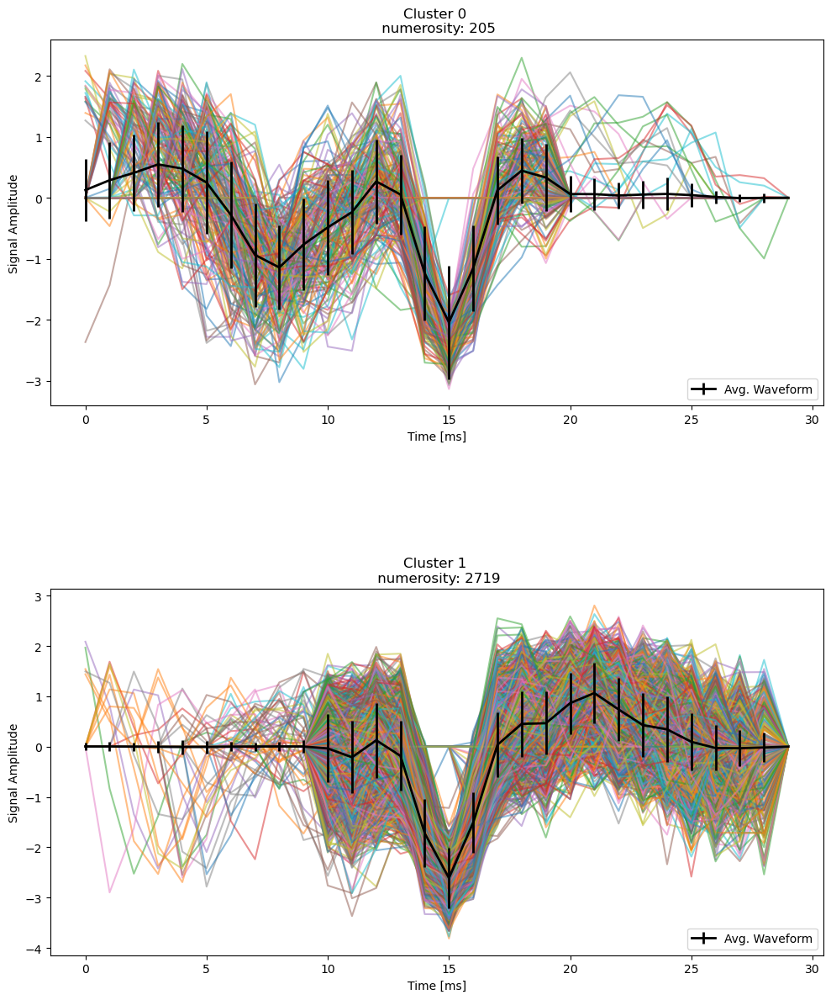

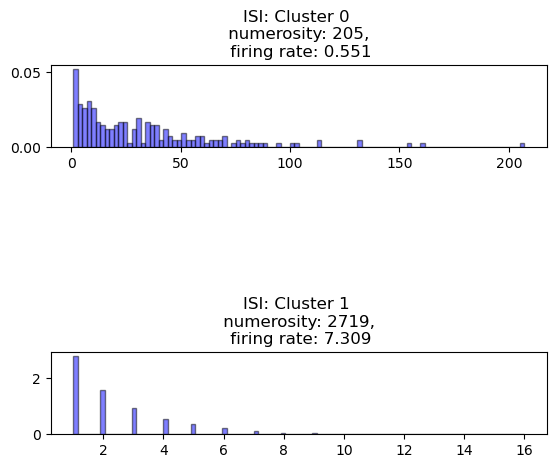

In [108]:
scale = StandardScaler()
estratti_norm = scale.fit_transform(cut)
print('Total spikes: ', estratti_norm.shape[0])
n_comp=10
pca = PCA(n_components=n_comp)
transformed = pca.fit_transform(estratti_norm)
#transformed=cut
#print('Total spikes: ', len(transformed))

info=[]
best_score=[]
if clustering=='kmeans':
    for n in range (n_min,n_tries):
        model = KMeans(n_clusters=n, n_init='auto', copy_x=True, algorithm='lloyd')
        labels = model.fit_predict(transformed)
        if (n != 1):
            silhouette_avg = silhouette_score(transformed, labels)
            print("For", n,"clusters, the silhouette score is:", format(silhouette_avg, ".3f"))#, 'CH score',format(CH, ".3f"),'DB score',format(DB, ".3f"))
            best_score.append(silhouette_avg)
            del(model)
            del(labels)
    top_clusters = (best_score.index(max(best_score)))+n_min
    num_clusters=top_clusters
    print("\n\n\033[1;31;47mBest cluster in the range", n_min, "to ", n_tries-1, ": ",top_clusters,", with a silhouette score of: ",best_score[top_clusters-n_min], "\u001b[0m  \n\n")

    model = KMeans(n_clusters=top_clusters, n_init='auto', copy_x=True, algorithm='lloyd')
    labels = model.fit_predict(transformed)

final_data=[]
temporary_data=[]
unique_labels = np.unique(labels)
firings=np.zeros(len(unique_labels))

fig = plt.figure(figsize=(10, 12))

# Iterate over unique cluster labels
for i, cluster_label in enumerate(unique_labels):
    cluster_data = cut[labels == cluster_label]
    firings[i]=len(cluster_data)*10000/len_data
    if len(unique_labels)<=2:
        size1=len(unique_labels)
        size2=1
    elif len(unique_labels)<=5:
        size1 = math.ceil(len(unique_labels)/2)
        size2=size1
    elif len(unique_labels)<=8:
        size1 = 3
        size2=math.ceil(len(unique_labels)/size1)
    else:
        size1=6
        size2=math.ceil(len(unique_labels)/size1)
    plt.subplot(size1,size2, i + 1)
    plt.plot(cluster_data.transpose(), alpha=0.5)  # Use alpha for transparency
    plt.title(f'Cluster {cluster_label} \n numerosity: {len(cluster_data)}')
    plt.xlabel('Time [ms]')
    plt.ylabel('Signal Amplitude')

    mean_wave = np.mean(cluster_data, axis=0)
    info.append(f'mean clus{cluster_label}')
    info.append(mean_wave)
    std_wave = np.std(cluster_data, axis=0)
    plt.errorbar(range(mean_wave.shape[0]), mean_wave, yerr=std_wave, color='black', linewidth=2, label='Avg. Waveform')
    plt.legend(loc='lower right')
plt.tight_layout()

mean_firing=np.mean(firings)
std_firing=np.std(firings)
firing_threshold=mean_firing-3*std_firing
print('firing rate threshold: ',firing_threshold)
info.append('firing threshold')
info.append(firing_threshold)
info.append('mean firing')
info.append(mean_firing)
plt.subplots_adjust(hspace=0.5)
plt.show()

for i in range(0,len(unique_labels)):
    ul=spike_list[labels==i]
    temporary_data.append(ul)
    fr=len(temporary_data[i])*10000/len_data
    if i != -1 and fr>firing_threshold:
        final_data.append(ul)
    plt.subplot(size1, size2, i + 1)
    plt.hist(np.diff(ul), bins=100, density=True, alpha=0.5, color='blue', edgecolor='black')
    plt.title(f'ISI: Cluster {i} \n numerosity: {len(temporary_data[i])}, \n firing rate: {format(len(temporary_data[i])*10000/len_data, ".3f")}')
plt.subplots_adjust(hspace=2.5)
plt.show()


In [100]:
labels

array([0, 1, 0, ..., 1, 3, 1], dtype=int32)

In [101]:
spike_list

[array([3]),
 array([11]),
 array([13]),
 array([14]),
 array([22]),
 array([24]),
 array([25]),
 array([31]),
 array([33]),
 array([36]),
 array([41]),
 array([44]),
 array([47]),
 array([49]),
 array([52]),
 array([55]),
 array([58]),
 array([64]),
 array([66]),
 array([68]),
 array([72]),
 array([75]),
 array([79]),
 array([81]),
 array([83]),
 array([90]),
 array([97]),
 array([98]),
 array([99]),
 array([101]),
 array([107]),
 array([108]),
 array([109]),
 array([120]),
 array([123]),
 array([125]),
 array([131]),
 array([132]),
 array([135]),
 array([137]),
 array([138]),
 array([139]),
 array([141]),
 array([142]),
 array([143]),
 array([145]),
 array([150]),
 array([154]),
 array([166]),
 array([184]),
 array([189]),
 array([192]),
 array([194]),
 array([198]),
 array([206]),
 array([207]),
 array([209]),
 array([223]),
 array([225]),
 array([226]),
 array([230]),
 array([233]),
 array([234]),
 array([237]),
 array([243]),
 array([244]),
 array([246]),
 array([251]),
 array([25

In [105]:

print('yes')
subgroup_indices = final_data[0]
spike_list0 = [np.where(np.isin(spike_list, indices))[0] for indices in subgroup_indices]
cut0 = [cut[pos] for pos in spike_list0]
spike_list=spike_list0
cut=cut0
#final_data0=try_clus(cut0,'kmeans',spike_list0,data)

#subgroup_indices = final_data[1]
#spike_list1 = [np.where(np.isin(spike_list, indices))[0] for indices in subgroup_indices]
#cut1 = [cut[pos] for pos in spike_list1]
#final_data1=try_clus(cut1,'kmeans',spike_list1,data)

yes


In [106]:
cut_np = np.array(cut)
cut = cut_np.reshape(cut_np.shape[0], -1)

In [107]:
original_indices = np.concatenate([arr.flatten() for arr in spike_list])
spike_list=original_indices
spike_list

array([   0,    1,    4, ..., 6630, 6632, 6634])

In [109]:
final_data

[array([  78,  128,  190,  191,  193,  217,  223,  249,  272,  308,  316,
         448,  500,  532,  579,  601,  626,  633,  691,  785,  859,  925,
         942,  955,  966, 1035, 1076, 1115, 1130, 1168, 1169, 1170, 1178,
        1191, 1211, 1226, 1266, 1329, 1360, 1378, 1398, 1403, 1437, 1461,
        1512, 1518, 1541, 1545, 1548, 1556, 1570, 1600, 1703, 1707, 1710,
        1724, 1878, 1907, 1908, 1928, 1958, 1977, 1978, 2038, 2041, 2053,
        2089, 2097, 2107, 2122, 2141, 2145, 2166, 2200, 2209, 2215, 2231,
        2288, 2495, 2534, 2545, 2546, 2570, 2600, 2644, 2712, 2748, 2778,
        2780, 2893, 2928, 2953, 2984, 2993, 3031, 3041, 3072, 3075, 3176,
        3179, 3183, 3233, 3238, 3249, 3288, 3359, 3403, 3450, 3454, 3457,
        3466, 3488, 3497, 3507, 3529, 3566, 3579, 3608, 3626, 3693, 3775,
        3776, 3937, 3992, 4037, 4041, 4126, 4133, 4186, 4210, 4238, 4245,
        4331, 4335, 4346, 4405, 4427, 4432, 4471, 4524, 4612, 4655, 4706,
        4775, 4820, 4827, 4836, 4840, 

In [63]:
print(len(subgroup_spikes),len(final_data_neg_BL[0]))
subgroup_spikes[0]

15184 15184


array([ 0.        ,  0.        , -0.73765548, -0.15662331, -0.59204738,
       -0.16358978,  1.71003741,  2.20173746,  1.0970105 ,  0.76105688,
        0.7433833 ,  0.00830269, -0.00845268,  0.33666503, -1.0550211 ,
       -2.49065994, -1.44874781, -0.24020866, -1.13548999, -1.81451012,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ])

# modeling

In [19]:
neurons_BL = []
for neuron in final_data_pos_BL:
    neurons_BL.append(neuron)
for neuron in final_data_neg_BL:
    neurons_BL.append(neuron)
neurons_BL

NameError: name 'final_data_neg_BL' is not defined

In [ ]:
neurons_st = []
for neuron in final_data_pos_st:
    neurons_st.append(neuron)
for neuron in final_data_neg_st:
    neurons_st.append(neuron)
neurons_st

In [ ]:
neurons_24 = []
for neuron in final_data_pos_24:
    neurons_24.append(neuron)
for neuron in final_data_neg_24:
    neurons_24.append(neuron)
neurons_24

In [110]:
neurons=[]
for neuron in final_data:
    neurons.append(neuron)
neurons

[array([  78,  128,  190,  191,  193,  217,  223,  249,  272,  308,  316,
         448,  500,  532,  579,  601,  626,  633,  691,  785,  859,  925,
         942,  955,  966, 1035, 1076, 1115, 1130, 1168, 1169, 1170, 1178,
        1191, 1211, 1226, 1266, 1329, 1360, 1378, 1398, 1403, 1437, 1461,
        1512, 1518, 1541, 1545, 1548, 1556, 1570, 1600, 1703, 1707, 1710,
        1724, 1878, 1907, 1908, 1928, 1958, 1977, 1978, 2038, 2041, 2053,
        2089, 2097, 2107, 2122, 2141, 2145, 2166, 2200, 2209, 2215, 2231,
        2288, 2495, 2534, 2545, 2546, 2570, 2600, 2644, 2712, 2748, 2778,
        2780, 2893, 2928, 2953, 2984, 2993, 3031, 3041, 3072, 3075, 3176,
        3179, 3183, 3233, 3238, 3249, 3288, 3359, 3403, 3450, 3454, 3457,
        3466, 3488, 3497, 3507, 3529, 3566, 3579, 3608, 3626, 3693, 3775,
        3776, 3937, 3992, 4037, 4041, 4126, 4133, 4186, 4210, 4238, 4245,
        4331, 4335, 4346, 4405, 4427, 4432, 4471, 4524, 4612, 4655, 4706,
        4775, 4820, 4827, 4836, 4840, 

In [116]:
neurons[1]

array([   0,    1,    4, ..., 6630, 6632, 6634])

neur:  1 2719


(array([1128.,    0.,    0.,  643.,    0.,    0.,  378.,    0.,    0.,
           0.,  226.,    0.,    0.,  151.,    0.,    0.,   86.,    0.,
           0.,   46.,    0.,    0.,    0.,   20.,    0.,    0.,   15.,
           0.,    0.,    0.,    6.,    0.,    0.,    8.,    0.,    0.,
           5.,    0.,    0.,    2.,    0.,    0.,    0.,    2.,    0.,
           0.,    0.,    0.,    0.,    2.]),
 array([0.0001 , 0.00013, 0.00016, 0.00019, 0.00022, 0.00025, 0.00028,
        0.00031, 0.00034, 0.00037, 0.0004 , 0.00043, 0.00046, 0.00049,
        0.00052, 0.00055, 0.00058, 0.00061, 0.00064, 0.00067, 0.0007 ,
        0.00073, 0.00076, 0.00079, 0.00082, 0.00085, 0.00088, 0.00091,
        0.00094, 0.00097, 0.001  , 0.00103, 0.00106, 0.00109, 0.00112,
        0.00115, 0.00118, 0.00121, 0.00124, 0.00127, 0.0013 , 0.00133,
        0.00136, 0.00139, 0.00142, 0.00145, 0.00148, 0.00151, 0.00154,
        0.00157, 0.0016 ]),
 <BarContainer object of 50 artists>)

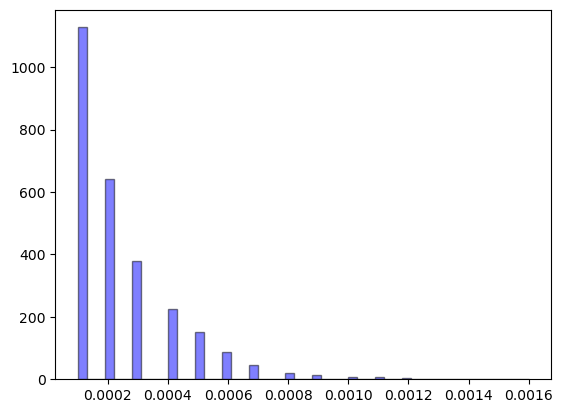

In [117]:
#neurons=neurons_BL
#neurons=neurons_st
#neurons=neurons_24
x=randint(0,len(neurons)-1)
print('neur: ',x,len(neurons[x]))
data_healthy=neurons[x]
ISI_healthy = np.diff(data_healthy)/10000
plt.hist(ISI_healthy, bins=50, density=False, alpha=0.5, color='blue', edgecolor='black')

In [128]:
ISI_data=ISI_healthy

def th_Bayesian_mixture_model(ISI_data):
    with pm.Model() as model:
        ##### WALD DISTRIBUTION (INVERSE GAUSSIAN)
        mu1 = pm.Uniform('mu1',lower=0.01,upper=0.1)
        lam1 = pm.Uniform('lam1',lower=0.01,upper=0.04)
        obs1 = pm.Wald.dist(mu=mu1,lam=lam1)


        mu2 = pm.Uniform('mu2',lower=0,upper=0.2)
        sigma2 = pm.Uniform('sigma2',lower=0.0001,upper=0.5)
        obs2 = pm.TruncatedNormal.dist(mu=mu2, sigma=sigma2, lower=0.0)

        mu3 = pm.Uniform('mu3',lower=0.1,upper=0.6)
        sigma3 = pm.Uniform('sigma3',lower=0.0001,upper=0.5)
        obs3 = pm.TruncatedNormal.dist(mu=mu3, sigma=sigma3, lower=0.0)


        w = pm.Dirichlet('w', a=np.array([1., .4, .4]))
        #w = pm.Dirichlet('w', a=np.array([1., .4]))

        like = pm.Mixture('like', w=w, comp_dists = [obs1, obs2, obs3], observed=ISI_data)
        #like = pm.Mixture('like', w=w, comp_dists = [obs1, obs2], observed=ISI_data)
        

        step = pm.NUTS(target_accept=0.9)
        trace = pm.sample(step=step,draws=1000,chains=1,tune=1000,cores=4)
        
        ppc_trace = pm.sample_posterior_predictive(trace,model=model)
        
    map_estimate = pm.find_MAP(model=model)
    del map_estimate['w_simplex__']
    del map_estimate['mu1_interval__']
    del map_estimate['lam1_interval__']
    del map_estimate['mu2_interval__']
    del map_estimate['sigma2_interval__']
    del map_estimate['mu3_interval__']
    del map_estimate['sigma3_interval__']

    map_estimate['w1'] = map_estimate['w'][0]
    map_estimate['w2'] = map_estimate['w'][1]
    map_estimate['w3'] = map_estimate['w'][2]

    del map_estimate['w']


    return map_estimate, ppc_trace


In [129]:
#map_estimate,ppc_trace = Bayesian_mixture_model(ISI_healthy)
map_estimate, ppc_trace = th_Bayesian_mixture_model(ISI_healthy)

Sequential sampling (1 chains in 1 job)
NUTS: [mu1, lam1, mu2, sigma2, mu3, sigma3, w]


Sampling 1 chain for 1_000 tune and 1_000 draw iterations (1_000 + 1_000 draws total) took 69 seconds.
Only one chain was sampled, this makes it impossible to run some convergence checks
Sampling: [like]


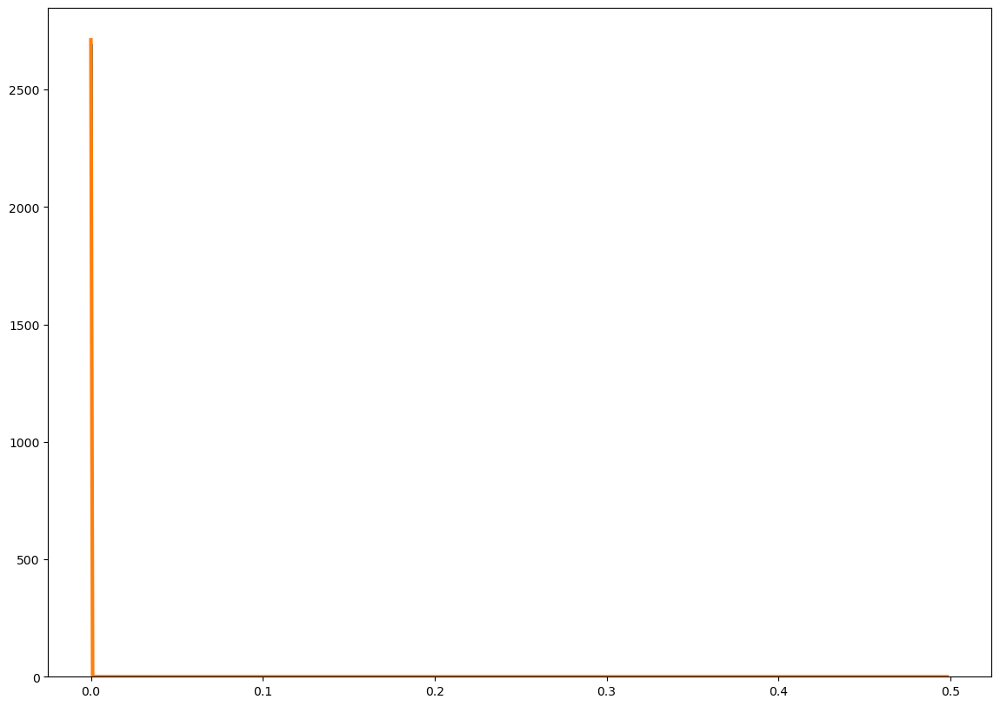

In [133]:
#with model:
#    ppc_trace = pm.sample_posterior_predictive(trace,model=model)

bins = np.arange(0, .5, 1e-3) 
plt.figure (figsize=(14,10))

hist = np.histogram(ppc_trace['posterior_predictive']['like'].values,bins=bins)
#plt.axis([0,0.3,0,160])
a= plt.hist(ISI_healthy,bins)
plt.plot(hist[1][:-1],hist[0]/1000,linewidth=3);

In [134]:
lista_samples=[]
for i in list(ppc_trace['posterior_predictive']['like'].values):
    lista_samples.extend(i)

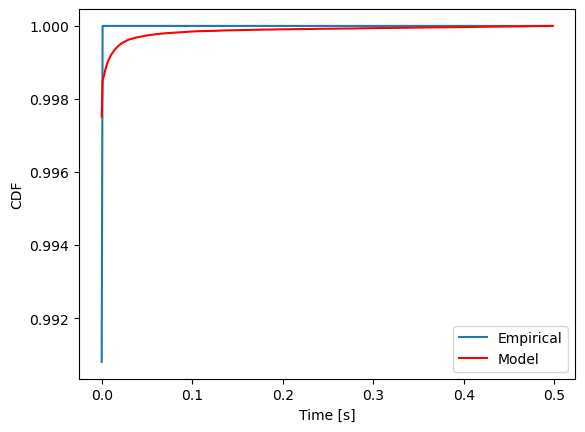

In [135]:
counts, _ = np.histogram(ISI_healthy, bins) 
prob_emp = counts / np.sum(counts)
counts, _ = np.histogram(lista_samples, bins) 
prob_model = counts / np.sum(counts)

Femp = np.cumsum(prob_emp)           
Fmodel = np.cumsum(prob_model)          
plt.figure()
plt.plot(bins[:-1], Femp)                
plt.plot(bins[:-1], Fmodel, 'r')       
#plt.xlim([0, 0.2])                  
plt.xlabel('Time [s]')
plt.ylabel('CDF')
plt.legend(['Empirical','Model'])
plt.show()

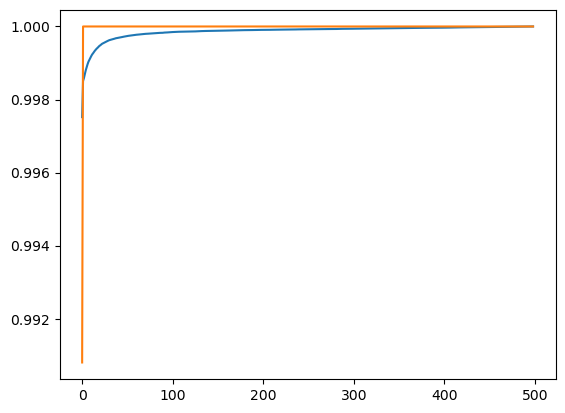

In [146]:
plt.plot(Fmodel)
plt.plot(Femp)

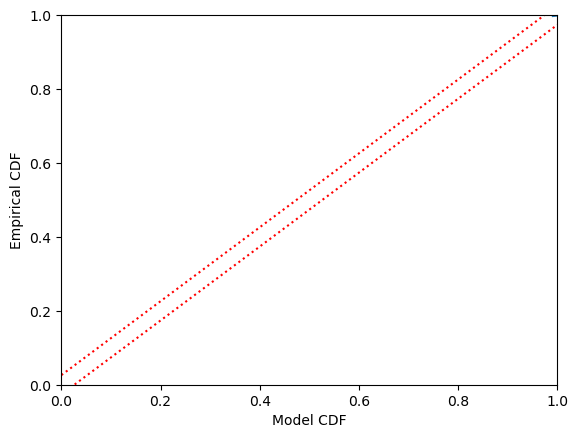

In [142]:
plt.figure()
Nlow = len(ISI_healthy)  
# Plot the confidence bounds
plt.plot([0, 1], [x + 1.36 / np.sqrt(Nlow) for x in [0, 1]], 'r:')
plt.plot([0, 1], [x - 1.36 / np.sqrt(Nlow) for x in [0, 1]], 'r:')
plt.plot(Femp, Fmodel)
plt.axis([0, 1, 0, 1])         
plt.xlabel('Model CDF')
plt.ylabel('Empirical CDF')
plt.show()

In [ ]:
spike_list=n_pos
spike_list
print(switch_index,max(spike_list))

In [ ]:
spike_list=np.array(spike_list)
spike_list1=[]
for spike_ind in tqdm(spike_list):
    if spike_ind<=switch_index:
        spike_list1.append(spike_ind)
spike_list1=np.array(spike_list1)
end_spikelist1=len(spike_list1)-1
spike_list2=spike_list[end_spikelist1+1:]

In [ ]:
len(pos_cut)

In [ ]:
pos_cut.shape

In [ ]:
len(spike_list1)

In [ ]:
pos_cut[:end_spikelist1+1].shape

In [ ]:
#def clus(cut,clustering,spike_list,data):
cut=pos_cut
clustering='kmeans'
spike_list=n_pos
data=merge
#switch_index=
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN, HDBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.metrics import silhouette_score
from scipy.stats import kurtosis
import skfuzzy as fuzz
import numpy as np
import math
n_min=3
n_tries=15
spike_list=np.array(spike_list)
spike_list1=[]
for spike_ind in tqdm(spike_list):
    if spike_ind<=switch_index:
        spike_list1.append(spike_ind)
spike_list1=np.array(spike_list1)
end_spikelist1=len(spike_list1)-1
spike_list2=spike_list[end_spikelist1+1:]

len_data1=len(data[:switch_index])
len_data2=len(data[switch_index+1:])

cut1=pos_cut[:end_spikelist1]
cut2=pos_cut[end_spikelist1+1:]

scale = StandardScaler()
estratti_norm = scale.fit_transform(cut1)
print('Total spikes cut1: ', estratti_norm.shape[0])
n_comp=10
pca = PCA(n_components=n_comp)
transformed1 = pca.fit_transform(estratti_norm)

estratti_norm = scale.fit_transform(cut2)
print('Total spikes cut2: ', estratti_norm.shape[0])
n_comp=10
pca = PCA(n_components=n_comp)
transformed2 = pca.fit_transform(estratti_norm)


info1=[]
info2=[]
#list_score=[]
#DB_score=[]
best_score=[]
if clustering=='kmeans':
    for n in range (n_min,n_tries):
        model = KMeans(n_clusters=n, n_init='auto', copy_x=True, algorithm='lloyd')
        labels1 = model.fit_predict(transformed1)
        labels2 = model.fit_predict(transformed2)
        if (n != 1):
            silhouette_avg1 = silhouette_score(transformed1, labels1)
            silhouette_avg2 = silhouette_score(transformed2, labels2)
            print("For", n,"clusters, the silhouette score is:", format(silhouette_avg1, ".3f"), format(silhouette_avg2, ".3f"))
            best_score.append(silhouette_avg1+silhouette_avg2)
            #del(model)
            #del(labels)
    top_clusters = (best_score.index(max(best_score)))+n_min
    num_clusters=top_clusters
    print("\n\n\033[1;31;47mBest cluster in the range", n_min, "to ", n_tries-1, ": ",top_clusters,", with a silhouette score of: ",best_score[top_clusters-n_min], "\u001b[0m  \n\n")

    model = KMeans(n_clusters=top_clusters, n_init='auto', copy_x=True, algorithm='lloyd')
    labels1 = model.fit_predict(transformed1)
    labels2 = model.fit_predict(transformed2)
######################### 
#adesso abbiamo due clusterizzazioni con lo stesso numero di cluster e bisogna accoppiarli per identificare i neuroni

#primo clustering
final_data=[]
temporary_data=[]
labels=labels1
cut=cut1
unique_labels = np.unique(labels)
firings=np.zeros(len(unique_labels))

fig = plt.figure(figsize=(10, 12))

# Iterate over unique cluster labels
for i, cluster_label in enumerate(unique_labels):
    # Extract data points for the current cluster
    cluster_data = cut[labels == cluster_label]
    firings[i]=len(cluster_data)*10000/len_data

    # Plot the individual cluster data
    if len(unique_labels)<=2:
        size1=len(unique_labels)
        size2=1
    elif len(unique_labels)<=5:
        size1 = math.ceil(len(unique_labels)/2)
        size2=size1
    elif len(unique_labels)<=8:
        size1 = 3
        size2=math.ceil(len(unique_labels)/size1)
    else:
        size1=6
        size2=math.ceil(len(unique_labels)/size1)
    plt.subplot(size1,size2, i + 1)
    plt.plot(cluster_data.transpose(), alpha=0.5)  # Use alpha for transparency
    #print(cluster_data)
    plt.title(f'Cluster {cluster_label} \n numerosity: {len(cluster_data)}')
    plt.xlabel('Time [ms]')
    plt.ylabel('Signal Amplitude')

    # Plot the average waveform
    mean_wave = np.mean(cluster_data, axis=0)
    #info.append(f'mean clus{cluster_label}')
    info1.append(mean_wave)
    std_wave = np.std(cluster_data, axis=0)
    plt.errorbar(range(mean_wave.shape[0]), mean_wave, yerr=std_wave, color='black', linewidth=2, label='Avg. Waveform')
    plt.legend(loc='lower right')
plt.tight_layout()

####secondo clustering
final_data=[]
temporary_data=[]
labels=labels2
cut=cut2
unique_labels = np.unique(labels)
firings=np.zeros(len(unique_labels))

fig = plt.figure(figsize=(10, 12))

# Iterate over unique cluster labels
for i, cluster_label in enumerate(unique_labels):
    # Extract data points for the current cluster
    cluster_data = cut[labels == cluster_label]
    firings[i]=len(cluster_data)*10000/len_data

    # Plot the individual cluster data
    if len(unique_labels)<=2:
        size1=len(unique_labels)
        size2=1
    elif len(unique_labels)<=5:
        size1 = math.ceil(len(unique_labels)/2)
        size2=size1
    elif len(unique_labels)<=8:
        size1 = 3
        size2=math.ceil(len(unique_labels)/size1)
    else:
        size1=6
        size2=math.ceil(len(unique_labels)/size1)
    plt.subplot(size1,size2, i + 1)
    plt.plot(cluster_data.transpose(), alpha=0.5)  # Use alpha for transparency
    #print(cluster_data)
    plt.title(f'Cluster {cluster_label} \n numerosity: {len(cluster_data)}')
    plt.xlabel('Time [ms]')
    plt.ylabel('Signal Amplitude')

    # Plot the average waveform
    mean_wave = np.mean(cluster_data, axis=0)
    #info.append(f'mean clus{cluster_label}')
    info1.append(mean_wave)
    std_wave = np.std(cluster_data, axis=0)
    plt.errorbar(range(mean_wave.shape[0]), mean_wave, yerr=std_wave, color='black', linewidth=2, label='Avg. Waveform')
    plt.legend(loc='lower right')
plt.tight_layout()

########### cambiato fino a qua


In [ ]:
len(info1)

In [ ]:
##qua bisogna creare le coppie


model = KMeans(n_clusters=9, n_init='auto', copy_x=True, algorithm='lloyd')
labels = model.fit_predict(info1)
        
final_data=[]
temporary_data=[]
#labels=labels2
cut=info1
unique_labels = np.unique(labels)
firings=np.zeros(len(unique_labels))

fig = plt.figure(figsize=(10, 12))
print(labels,unique_labels)
# Iterate over unique cluster labels
for i, cluster_label in enumerate(unique_labels):
    # Extract data points for the current cluster
    cluster_data = cut[labels == cluster_label]
    firings[i]=len(cluster_data)*10000/len_data

    # Plot the individual cluster data
    if len(unique_labels)<=2:
        size1=len(unique_labels)
        size2=1
    elif len(unique_labels)<=5:
        size1 = math.ceil(len(unique_labels)/2)
        size2=size1
    elif len(unique_labels)<=8:
        size1 = 3
        size2=math.ceil(len(unique_labels)/size1)
    else:
        size1=6
        size2=math.ceil(len(unique_labels)/size1)
    plt.subplot(size1,size2, i + 1)
    plt.plot(cluster_data.transpose(), alpha=0.5)  # Use alpha for transparency
    #print(cluster_data)
    plt.title(f'Cluster {cluster_label} \n numerosity: {len(cluster_data)}')
    plt.xlabel('Time [ms]')
    plt.ylabel('Signal Amplitude')

    # Plot the average waveform
    mean_wave = np.mean(cluster_data, axis=0)
    #info.append(f'mean clus{cluster_label}')
    info1.append(mean_wave)
    std_wave = np.std(cluster_data, axis=0)
    plt.errorbar(range(mean_wave.shape[0]), mean_wave, yerr=std_wave, color='black', linewidth=2, label='Avg. Waveform')
    plt.legend(loc='lower right')
plt.tight_layout()


In [ ]:
mean_firing=np.mean(firings)
std_firing=np.std(firings)
firing_threshold=mean_firing-std_firing
print('firing rate threshold: ',firing_threshold)
info.append('firing threshold')
info.append(firing_threshold)
info.append('mean firing')
info.append(mean_firing)
plt.subplots_adjust(hspace=0.5)
plt.show()

for i in range(0,len(unique_labels)):
    ul=spike_list[labels==i]
    temporary_data.append(ul)
    fr=len(temporary_data[i])*10000/len_data
    if i != -1 and fr>firing_threshold:
        final_data.append(ul)
    plt.subplot(size1, size2, i + 1)
    plt.hist(np.diff(ul), bins=100, density=True, alpha=0.5, color='blue', edgecolor='black')
    plt.title(f'ISI: Cluster {i} \n numerosity: {len(temporary_data[i])}, \n firing rate: {format(len(temporary_data[i])*10000/len_data, ".3f")}')
plt.subplots_adjust(hspace=2.5)
plt.show()
del(unique_labels)
return final_data


In [ ]:
final_data_pos= clus(pos_cut,'kmeans',n_pos,merge)

In [ ]:
final_data_neg=[]

for channel in (tqdm(range(len(neg_cut)))):
    channel_clusters=clus(neg_cut[channel],'kmeans',n_neg[channel],prova.iloc[:,channel])
    final_data_neg.append(channel_clusters)